# Imports

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, accuracy_score, classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from datetime import datetime

# Constants

In [2]:
RANDOM_STATE = 41
directory = 'Stress-Predict-Dataset-main/Raw_data'

# Helper Functions

In [3]:
def percent_missing(df):
    """
    Returns the percent of missing values in each column in a dataframe
    """
    percent_nan = 100 * df.isnull().sum() / len(df)
    percent_nan = percent_nan.sort_values()
    return percent_nan

In [4]:
def nan_barplot(data):
    """
    Plots a bargraph of all features and their missing values
    """
    percent_nan = percent_missing(data)
    sns.barplot(x=percent_nan.index, y=percent_nan)
    plt.xticks(rotation=90);

In [474]:
def plot_conf_mat(conf_mat):
    """
    Plots a confucion matrix using Seaborn's heatmap()
    """
    fig, ax = plt.subplots(figsize=(3,3))
    ax = sns.heatmap(conf_mat, annot=True, cbar=True, fmt='g')
    plt.xlabel("True label")
    plt.ylabel("Predicted label")

In [448]:
def get_feature_importance_graph(model_feat_imp):
    """
    Plots features vs it's importance to the model's predictions
    """
    features = pd.DataFrame(index=X.columns, data=model_feat_imp, columns=['Importance'])
    sns.barplot(data=features, x=features.index, y='Importance')
    plt.xticks(rotation=90);

In [449]:
def get_classifier_metrics(y_test, y_preds):
    """
    Prints the classification report, accuracy and confusion matrix of a classification model
    """
    print(classification_report(y_test, y_preds))
    print(pd.crosstab(y_test, y_preds, rownames=["Actual Labels"], colnames=["Predicted Labels"]))
    print('Accuracy :',accuracy_score(y_test, y_preds))
    plot_conf_mat(confusion_matrix(y_test, y_preds))

In [450]:
def evaluate_preds(y_preds, y_true):
    """
    Performs evaluation comparison on y_true labels vs y_preds labels.
    """
    #y_preds = model.predict(X_test)
    
    accuracy = accuracy_score(y_true, y_preds)
    precision = precision_score(y_true, y_preds)
    recall = recall_score(y_true, y_preds)
    f1 = f1_score(y_true, y_preds)
    metric_dict = {"accuracy": round(accuracy, 2), "precision": round(precision, 2), "recall": round(recall, 2), "f1": round(f1, 2)}
    print(f"Accuracy: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 score: {f1:.2f}")
    print('\n')
    return metric_dict

In [74]:
def plot_participant_progression(data, participant, feature):
    """
    Plots the participant's readings vs time on a lineplot
    """
    #sns.reset_defaults()
    plt.figure(figsize=(30,16), dpi=300)
    plot_data = data[data['participant'] == participant]
    plt.xlabel('Time')
    plt.ylabel('Participant '+str(participant)+' - '+feature)
    #sns.set_palette("PuBuGn_d")
    sns.lineplot(data=plot_data, x='time', y=feature, palette=['b', 'r'], hue='label')

In [10]:
def get_participant_data(model_data, participant_id):
    return model_data[participant_id]['data']

# Description of the dataset - University Trial

.csv files in this archive are in the following format:
The first row is the initial time of the session expressed as unix timestamp in UTC.
The second row is the sample rate expressed in Hz.

TEMP.csv
Data from temperature sensor expressed degrees on the Celsius (°C) scale.

EDA.csv
Data from the electrodermal activity sensor expressed as microsiemens (μS).

BVP.csv
Data from photoplethysmograph (PPG).

ACC.csv
Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore the unit in this file is 1/64g.
Data from x, y, and z axis are respectively in first, second, and third column.

IBI.csv
Time between individuals heart beats extracted from the BVP signal.
No sample rate is needed for this file.
The first column is the time (respect to the initial time) of the detected inter-beat interval expressed in seconds (s).
The second column is the duration in seconds (s) of the detected inter-beat interval (i.e., the distance in seconds from the previous beat).

HR.csv
Average heart rate extracted from the BVP signal.The first row is the initial time of the session expressed as unix timestamp in UTC.
The second row is the sample rate expressed in Hz.


tags.csv
Event mark times.
Each row corresponds to a physical button press on the device; the same time as the status LED is first illuminated.
The time is expressed as a unix timestamp in UTC and it is synchronized with initial time of the session indicated in the related data files from the corresponding session.

In [11]:
# Colab
from google.colab import drive
drive.mount('/content/drive')
directory = '/content/drive/MyDrive/Colab Notebooks/datasets/Stress-Predict-Dataset-main/Raw_data'

ModuleNotFoundError: No module named 'google.colab'

In [12]:
features = {'HR': {'has_refresh': True, 
                  'columns':{0: 'HR'},
                  },
            'EDA': {'has_refresh': True, 
                  'columns':{0: 'EDA'},
                  },
            'BVP': {'has_refresh': True, 
                  'columns':{0: 'BVP'},
                  },
            'IBI': {'has_refresh': False, 
                  'columns':{0: 'IBI_DETECT_TIME', 1: 'IBI_DURATION'},
                  },
            'TEMP': {'has_refresh': True, 
                  'columns':{0: 'TEMP'},
                  },
            'ACC': {'has_refresh': True, 
                  'columns':{0: 'x', 1: 'y', 2: 'z'},
                  },
            }

In [13]:
def parse_data_to_df(participant_number, key, has_refresh, columns):
    '''
    Parse the raw sensor csv file into a usable dataframe
    '''
    df = pd.read_csv(directory+'/S'+str(participant_number).zfill(2)+'/'+key+'.csv', header=None)
    # Store initial timestamp
    time = int(df.iloc[0][0])
    if has_refresh:
        # Store sample rate of sensor. The values obtained are averaged in chunks of length sample_rate and stored as a singular row
        sample_rate = int(df.iloc[1][0])
        # Drop sensor and timestamp information from the original dataframe
        df.drop(index=[0, 1], axis=0, inplace=True)
        # Rename columns according to the specification in the features dict
        df.rename(columns=columns, inplace=True)
        for c in columns.values():
            # Mean of values of length sample_rate
            df[c] = df.groupby(df.index // sample_rate)[c].transform('mean')
        df = df.iloc[::int(sample_rate), :]
    else:
        # Condition to handle data without refresh rate
        df.rename(columns=columns, inplace=True)
        df.drop(index=[0], axis=0, inplace=True)
        if key == 'IBI':
            # Special case to handle IBI_xxx_xxx
            df['IBI_DETECT_TIME'] += time
            #df['IBI_DETECT_TIME'] = pd.to_numeric(df['IBI_DETECT_TIME'], downcast='integer')
            df['IBI_DETECT_TIME'] = df['IBI_DETECT_TIME'].round()
            df['IBI_DETECT_TIME'] = df['IBI_DETECT_TIME'].astype(int)
            df.rename(columns={'IBI_DETECT_TIME': 'time'}, inplace=True)
            df.reset_index(drop=True, inplace=True)
            #print(df)
            # IMPORTANT: Fill in missing values
            df.fillna(method='ffill', inplace=True)
            df.fillna(method='bfill', inplace=True)
            return df
    df.reset_index(drop=True, inplace=True)
    # Append timestamps to the dataframe starting from the initial timestamp to timestamp+len(data)
    df['time'] = range(time-1, time+len(df)-1)
    return df


In [14]:
invalid_participant_id = set()
def append_labels(data, participant_number):
    '''
    Append the target feature to the dataframe by referencing the timestamp file
    '''
    # Initialise all label (target variable) values to 0
    data['label'] = 0
    tags = pd.read_csv(directory+'/S'+str(participant_number).zfill(2)+'/tags_S'+str(participant_number).zfill(2)+'.csv', header=None)
    tags[0] = tags[0].round().astype(int)
    # Handle cases where timestamp dataframe has 9 and 7 rows
    if len(tags) == 9:
        # experiment name : [start timestamp index, end timestamp index, expected experiment duration + buffer duration (experiments might take a bit longer than specified) in mins]
        # 3 mins was chosen arbitrarily. Most experiments do not exceed 2 minutes from the expected duration
        stress_indices = {'stroop': [0, 1, 5+3], 'tsst': [2, 3, 10+3], 'hyperventilation': [4, 5, 2+1]}
    elif len(tags) == 7:
        stress_indices = {'stroop': [0, 1, 5+3], 'tsst': [2, 3, 10+3], 'hyperventilation': [4, 5, 2+1]}
    else:
        print('Unable to determine labels for patricipant', participant_number, '\n')
        invalid_participant_id.add(participant_number)
        print('-'*100)
        print('\n')
        return None
    for stressor in stress_indices:
            start = tags[0][stress_indices[stressor][0]]
            end = tags[0][stress_indices[stressor][1]]-1
            try:
                start_index = np.where(data['time'] == start)[0][0]
                end_index = np.where(data['time'] == end)[0][0]
            except:
                print('EXCLUDE PARTICIPANT '+str(participant_number)+'. INVALID TIMESTAMP')
                print('-'*100)
                print('\n')
                return None
            finally:
                difference = abs((float(end)-float(start))/(60))
                print('participant', participant_number, stressor, start, end, '%.3f'%difference, 'minutes')
                if difference > stress_indices[stressor][2]:
                    print('EXCLUDE PARTICIPANT '+str(participant_number)+'. INCORRECT TEST DURATION DETECTED')
                    invalid_participant_id.add(participant_number) 
                    print('-'*100)
                    print('\n')
                    return None
                
            print(start_index, end_index)
            #if difference > stress_indices[stressor][2]:
                #print('EXCLUDE PARTICIPANT '+str(participant_number)+'. INCORRECT TEST DURATION DETECTED')
                #invalid_participant_id.add(participant_number)  
            #indices = np.asarray(data.index[(data['time'] >= start) & (data['time'] <= end)].tolist())
            #print(indices)

            # Set stress test labels to 1
            data.loc[start_index:end_index, 'label'] = 1
    print('-'*100)
    print('\n')
    return data

In [15]:
def build_dataframe(participant_number):
    '''
    Merge all participant features into a single dataframe
    '''
    if participant_number < 1 or participant_number > n_participants:
        print('Invalid participant number')
        return None
    else:
        data = pd.DataFrame()
        count = 0
        for feature in features:
            df = parse_data_to_df(participant_number, feature, features[feature]['has_refresh'], features[feature ]['columns'])
            if count == 0:
                data = df.copy(deep=True)
            else:
                data = data.merge(df, on='time', how='outer')
            count += 1
        data.insert(0, 'participant', participant_number)
    return data

# Build merged dataset

Participant 1 has been excluded as the timestamps do not correspond to experment durations

In [16]:
n_participants = 35
def create_participant_dict():
    participant_data = dict()
    for i in range(2, n_participants+1):
        extracted_data = append_labels(build_dataframe(i), i)
        if extracted_data is not None:
            extracted_data.reset_index(drop=True, inplace=True)
            participant_data[i] = {'data': None}
            participant_data[i]['data'] = extracted_data
    return participant_data

In [17]:
model_data = create_participant_dict()

participant 2 stroop 1644228196 1644228571 6.250 minutes
613 1003
participant 2 tsst 1644228844 1644229498 10.900 minutes
1278 1936
participant 2 hyperventilation 1644229801 1644229930 2.150 minutes
2241 2375
----------------------------------------------------------------------------------------------------


participant 3 stroop 1644231934 1644232209 4.583 minutes
617 939
participant 3 tsst 1644232484 1644233025 9.017 minutes
1238 1815
participant 3 hyperventilation 1644233339 1644233487 2.467 minutes
2143 2296
----------------------------------------------------------------------------------------------------


participant 4 stroop 1644233954 1644234297 5.717 minutes
689 1096
participant 4 tsst 1644234583 1644235181 9.967 minutes
1397 2027
participant 4 hyperventilation 1644235484 1644235613 2.150 minutes
2344 2487
----------------------------------------------------------------------------------------------------


participant 5 stroop 1644830599 1644830944 5.750 minutes
825 1217
p

EXCLUDE PARTICIPANT 30. INVALID TIMESTAMP
----------------------------------------------------------------------------------------------------


participant 30 stroop 1646615464 1646658989 725.417 minutes
EXCLUDE PARTICIPANT 30. INCORRECT TEST DURATION DETECTED
----------------------------------------------------------------------------------------------------


participant 31 stroop 1646666430 1646666809 6.317 minutes
788 1299
participant 31 tsst 1646667129 1646667717 9.800 minutes
1675 2279
participant 31 hyperventilation 1646668057 1646668162 1.750 minutes
2636 2747
----------------------------------------------------------------------------------------------------


participant 32 stroop 1646667980 1646668360 6.333 minutes
592 972
participant 32 tsst 1646668669 1646669254 9.750 minutes
1281 1871
participant 32 hyperventilation 1646669559 1646669674 1.917 minutes
2176 2295
----------------------------------------------------------------------------------------------------


particip

In [18]:
participants = np.fromiter(model_data.keys(), dtype=int)
participants

array([ 2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35])

# Split train and test participants

In [19]:
train_split = round(0.8 * len(participants))
#valid_split = round(train_split + 0.2 * len(participants))

participants_train = participants[:train_split]
#participants_valid = participants[train_split:valid_split]
participants_test = participants[train_split:]

len(participants_train), len(participants_test)
print({'Training Participants': participants_train,
       'Training Count': len(participants_train),
       'Test Participants': participants_test,
       'Test Count': len(participants_test),
       'Total Number of Participants:': len(participants_train)+len(participants_test)})

{'Training Participants': array([ 2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28]), 'Training Count': 24, 'Test Participants': array([29, 31, 32, 33, 34, 35]), 'Test Count': 6, 'Total Number of Participants:': 30}


### Change n_participants from 35 to 24 to keep the testing set excluded during exploration

In [20]:
n_participants = len(participants_train)
n_participants

24

# Exploratory Data Analysis

## Check for consistent (numerical) data types across features

In [21]:
get_participant_data(model_data, 2).dtypes

participant       int64
HR              float64
time              int64
EDA             float64
BVP             float64
IBI_DURATION     object
TEMP            float64
x               float64
y               float64
z               float64
label             int64
dtype: object

**IBI_DURATION is not numeric. Will be converted**

In [22]:
for participant in participants_train:
    model_data[participant]['data']['IBI_DURATION'] = model_data[participant]['data']['IBI_DURATION'].apply(pd.to_numeric)
    model_data[participant]['data']['time'] = pd.to_datetime(model_data[participant]['data']['time'], unit = "s", )
for participant in participants_test:
    model_data[participant]['data']['IBI_DURATION'] = model_data[participant]['data']['IBI_DURATION'].apply(pd.to_numeric)
    model_data[participant]['data']['time'] = pd.to_datetime(model_data[participant]['data']['time'], unit = "s", )

get_participant_data(model_data, 4).dtypes


participant              int64
HR                     float64
time            datetime64[ns]
EDA                    float64
BVP                    float64
IBI_DURATION           float64
TEMP                   float64
x                      float64
y                      float64
z                      float64
label                    int64
dtype: object

In [23]:
get_participant_data(model_data, 27).describe()

,participant,HR,EDA,BVP,IBI_DURATION,TEMP,x,y,z,label
count,3680.0,3669.000000,3680.000000,3679.000000,1680.000000,3676.000000,3679.000000,3679.000000,3679.000000,3680.000000
mean,27.0,74.014977,0.310668,-0.064887,0.805087,28.102274,-31.058329,-0.023945,48.019820,0.358696
std,0.0,5.384596,0.157148,21.601063,0.076218,0.382416,12.302617,17.261708,17.866234,0.479683
min,27.0,60.050000,0.065611,-290.982344,0.546875,27.110000,-65.656250,-64.125000,-43.718750,0.000000
25%,27.0,70.370000,0.226381,-2.525859,0.750000,27.800000,-35.984375,-3.765625,48.140625,0.000000
50%,27.0,73.030000,0.263938,-0.008281,0.812500,28.180000,-27.750000,5.968750,55.281250,0.000000
75%,27.0,77.800000,0.365745,2.676172,0.859375,28.380000,-24.078125,8.937500,57.406250,1.000000
max,27.0,93.200000,1.711533,212.174375,1.187500,28.850000,16.375000,20.750000,63.156250,1.000000


In [24]:
get_participant_data(model_data, 2).describe()

,participant,HR,EDA,BVP,IBI_DURATION,TEMP,x,y,z,label
count,3611.0,3600.000000,3611.000000,3611.000000,360.000000,3611.000000,3610.000000,3610.000000,3610.000000,3611.000000
mean,2.0,78.413250,0.622925,-0.017825,0.866450,35.194961,-32.873777,-14.654291,28.235522,0.328164
std,0.0,13.351023,0.197151,32.217631,0.077611,0.446197,25.017950,23.838578,28.060669,0.469610
min,2.0,58.220000,0.015377,-457.539062,0.687500,30.510000,-66.375000,-62.406250,-54.125000,0.000000
25%,2.0,70.470000,0.515713,-9.463516,0.812500,34.995000,-60.687500,-29.085938,0.250000,0.000000
50%,2.0,75.290000,0.653465,0.102031,0.859375,35.140000,-37.281250,-10.515625,41.468750,0.000000
75%,2.0,83.535000,0.761583,10.009688,0.906250,35.310000,-15.226562,-5.062500,51.125000,1.000000
max,2.0,137.100000,0.967731,401.981406,1.171875,36.390000,51.593750,49.875000,64.468750,1.000000


In [25]:
get_participant_data(model_data, 19).describe()

,participant,HR,EDA,BVP,IBI_DURATION,TEMP,x,y,z,label
count,3367.0,3356.000000,3367.000000,3367.000000,1530.000000,3365.000000,3367.000000,3367.000000,3367.000000,3367.000000
mean,19.0,73.104541,0.239984,-0.109557,0.873897,30.865076,-31.384192,-2.110035,38.598809,0.304128
std,0.0,11.635744,0.195071,25.496024,0.082339,0.320637,23.759925,14.026653,28.396596,0.460106
min,19.0,54.670000,0.041000,-203.029844,0.640625,30.080000,-67.500000,-58.468750,-50.218750,0.000000
25%,19.0,66.730000,0.111469,-6.286250,0.812500,30.590000,-55.875000,-7.984375,15.968750,0.000000
50%,19.0,71.180000,0.164908,0.418594,0.875000,30.910000,-28.937500,-1.562500,55.156250,0.000000
75%,19.0,75.070000,0.272400,6.865547,0.921875,31.070000,-14.250000,4.078125,60.593750,1.000000
max,19.0,129.180000,1.936512,146.995625,1.171875,31.460000,46.250000,54.000000,64.562500,1.000000


## Aggregate train participant data to make visualization easier

In [34]:
data = get_participant_data(model_data, 2)
for participant in participants_train[1:]:
    data = pd.concat([data, get_participant_data(model_data, participant)], ignore_index=True)
    data.reset_index(drop=True, inplace=True)

In [35]:
data

,participant,HR,time,EDA,BVP,IBI_DURATION,TEMP,x,y,z,label
0,2,118.00,2022-02-07 09:53:03,0.615343,4.097813,0.687500,34.760,-28.468750,7.531250,56.937500,0
1,2,113.50,2022-02-07 09:53:04,0.614381,-14.942187,0.687500,34.780,-29.437500,-1.312500,52.281250,0
2,2,93.00,2022-02-07 09:53:05,0.544866,68.497187,0.687500,34.800,-34.593750,-16.875000,39.000000,0
3,2,93.25,2022-02-07 09:53:06,0.497453,-70.656875,0.687500,34.825,-61.593750,-18.906250,-2.500000,0
4,2,86.40,2022-02-07 09:53:07,0.463176,39.025781,0.687500,34.840,-61.281250,-20.125000,-4.062500,0
...,...,...,...,...,...,...,...,...,...,...,...
86649,28,114.93,2022-03-07 12:16:31,0.061504,0.165156,0.578125,26.640,-12.250000,-3.812500,62.000000,0
86650,28,114.93,2022-03-07 12:16:32,0.060543,-0.352500,0.578125,26.650,-12.718750,-3.843750,62.156250,0
86651,28,114.93,2022-03-07 12:16:33,0.060223,0.423594,0.578125,26.640,-12.781250,-3.468750,62.031250,0
86652,28,114.93,2022-03-07 12:16:34,0.060864,-2.064531,0.578125,26.610,-13.125000,-3.625000,62.062500,0


## Plot max, min and mean of TEMP

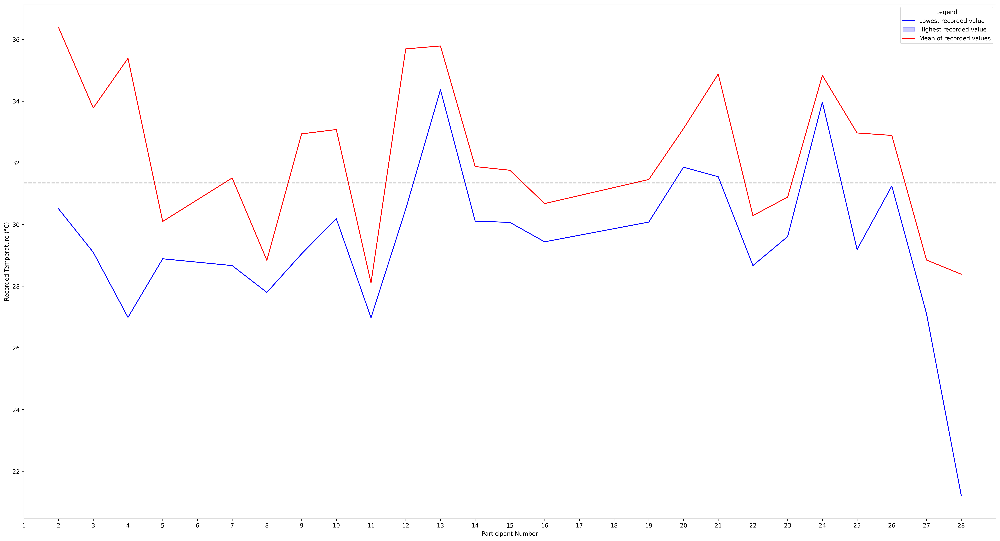

In [33]:
plt.figure(figsize=(30,16), dpi=300)
min_data = data.loc[data.groupby(['participant']).TEMP.idxmin()]
max_data = data.loc[data.groupby(['participant']).TEMP.idxmax()]

plt.xlim(2, max(participants_train)+1)
plt.xticks(range(1, max(participants_train)+1))
plt.xlabel('Participant Number')
plt.ylabel('Recorded Temperature (°C)')

sns.lineplot(data=min_data, x='participant', y='TEMP', color='b', legend=False)
sns.lineplot(data=max_data, x='participant', y='TEMP', color='r', legend=False)

plt.axhline(data['TEMP'].mean(), linestyle="--", color='black')
plt.legend(title='Legend', loc='upper right', labels=['Lowest recorded value', 'Highest recorded value', 'Mean of recorded values'])


## Plot max, min and mean of BVP

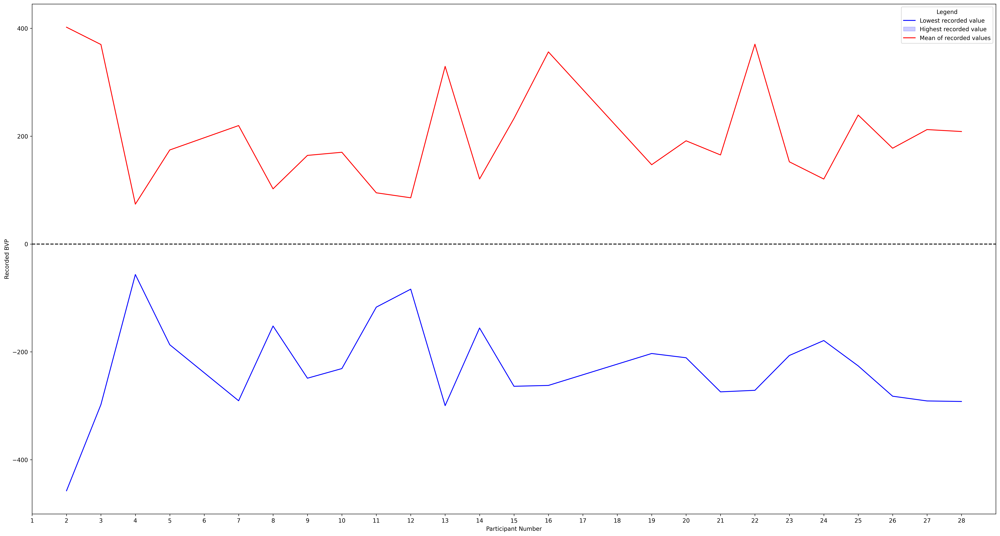

In [29]:
plt.figure(figsize=(30,16), dpi=300)
min_data = data.loc[data.groupby(['participant']).BVP.idxmin()]
max_data = data.loc[data.groupby(['participant']).BVP.idxmax()]

plt.xlim(2, max(participants_train)+1)
plt.xticks(range(1, max(participants_train)+1))
plt.xlabel('Participant Number')
plt.ylabel('Recorded BVP')

sns.lineplot(data=min_data, x='participant', y='BVP', color='b')
sns.lineplot(data=max_data, x='participant', y='BVP', color='r')

plt.axhline(data['BVP'].mean(), linestyle="--", color='black')
plt.legend(title='Legend', loc='upper right', labels=['Lowest recorded value', 'Highest recorded value', 'Mean of recorded values'])


## Investigate TEMP

**Sharp drop in temperature at the end of the experiment occurs for most participants but not all**

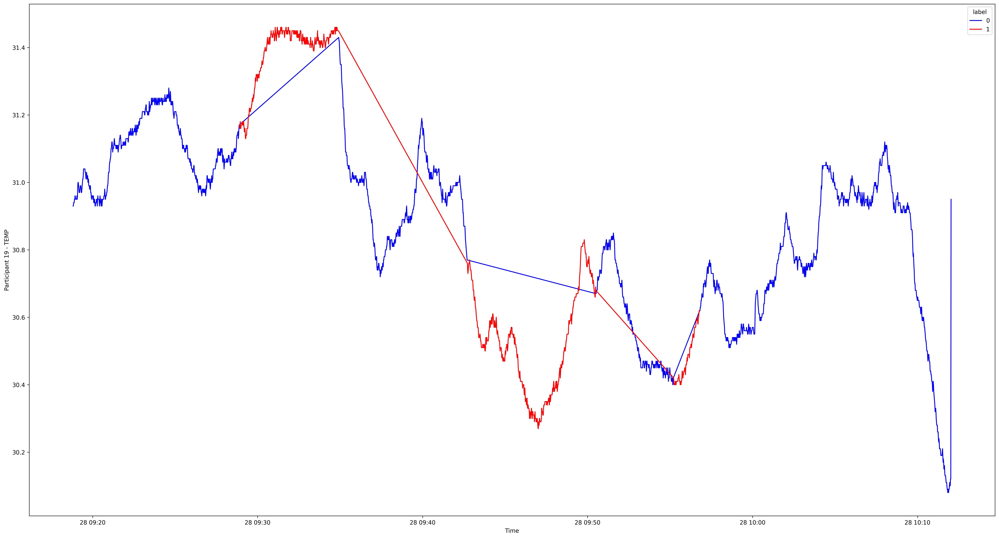

In [75]:
plot_participant_progression(data, 19, 'TEMP')

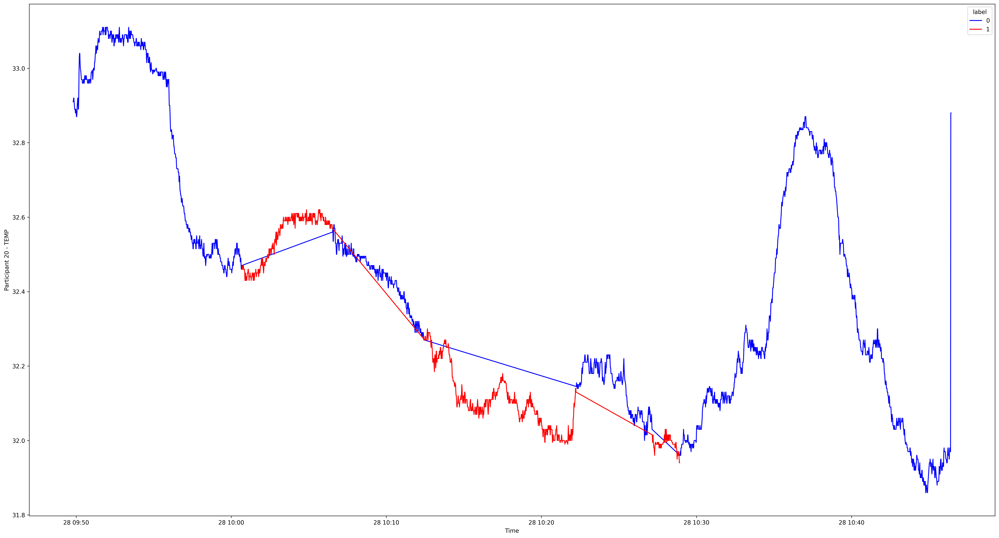

In [76]:
plot_participant_progression(data, 20, 'TEMP')

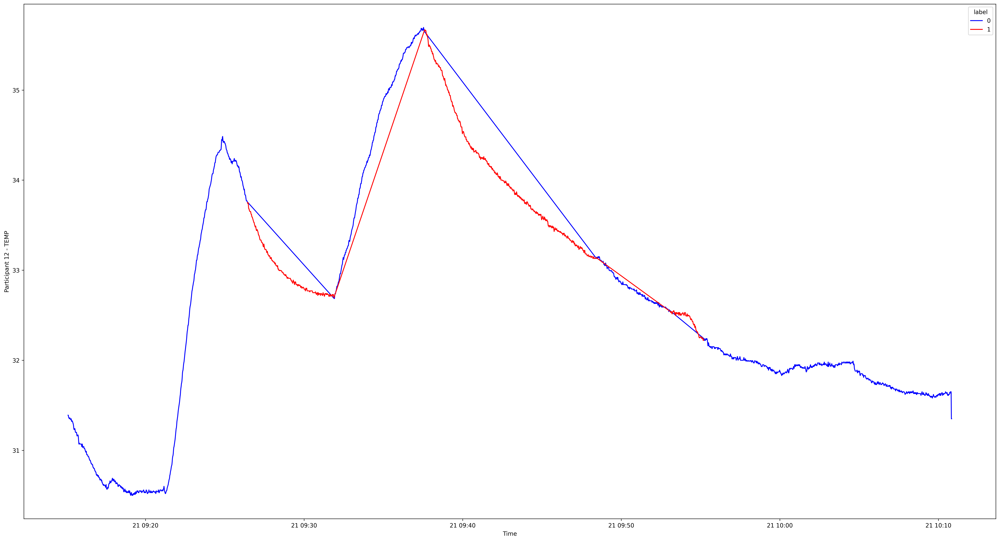

In [77]:
plot_participant_progression(data, 12, 'TEMP')

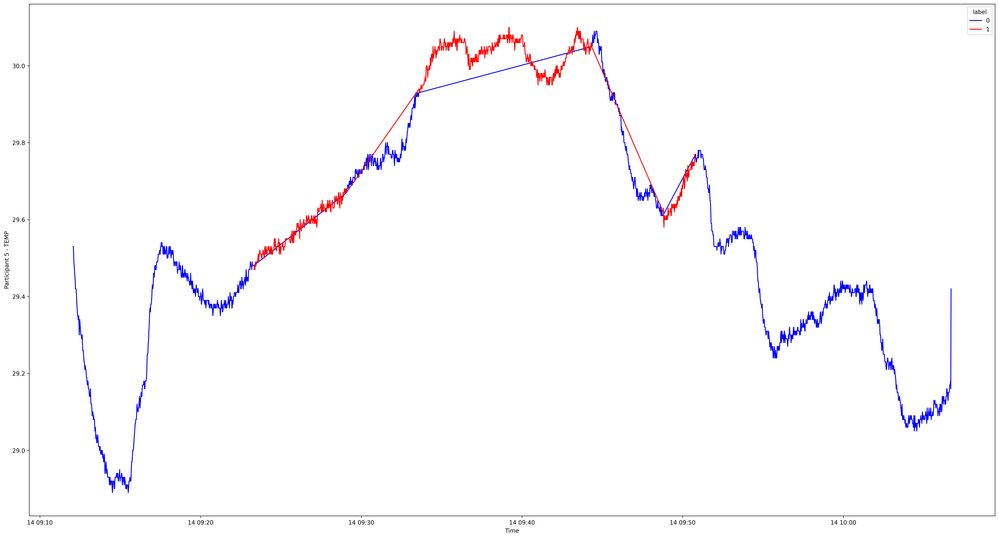

In [78]:
plot_participant_progression(data, 5, 'TEMP')

# Run once
temp = np.array(data['TEMP'])
temp = temp[~np.isnan(temp)]
p = np.quantile(temp, 0.25, axis=0)
old_len = len(data)
print(p)

data = data.drop(data[(data.TEMP < p)].index)
print(old_len - len(data), 'rows dropped due to possibly inaccurate temperature readings')

## Plot max, min and mean of HR

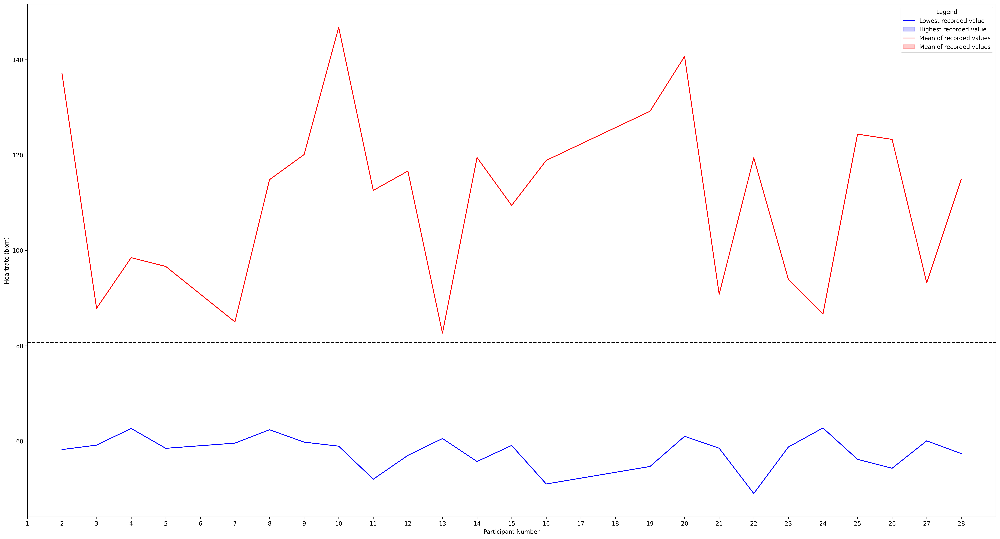

In [49]:
plt.figure(figsize=(30,16), dpi=300)
min_data = data.loc[data.groupby(['participant']).HR.idxmin()]
max_data = data.loc[data.groupby(['participant']).HR.idxmax()]

plt.xlim(2, max(participants_train)+1)
plt.xticks(range(1, max(participants_train)+1))

plt.xlabel('Participant Number')
plt.ylabel('Heartrate (bpm)')
sns.lineplot(data=min_data, x='participant', y='HR', color='b')
sns.lineplot(data=max_data, x='participant', y='HR', color='r')

plt.axhline(data['HR'].mean(), linestyle="--", color='black')
plt.legend(title='Legend', loc='upper right', labels=['Lowest recorded value', 'Highest recorded value', 'Mean of recorded values', 'Mean of recorded values'])


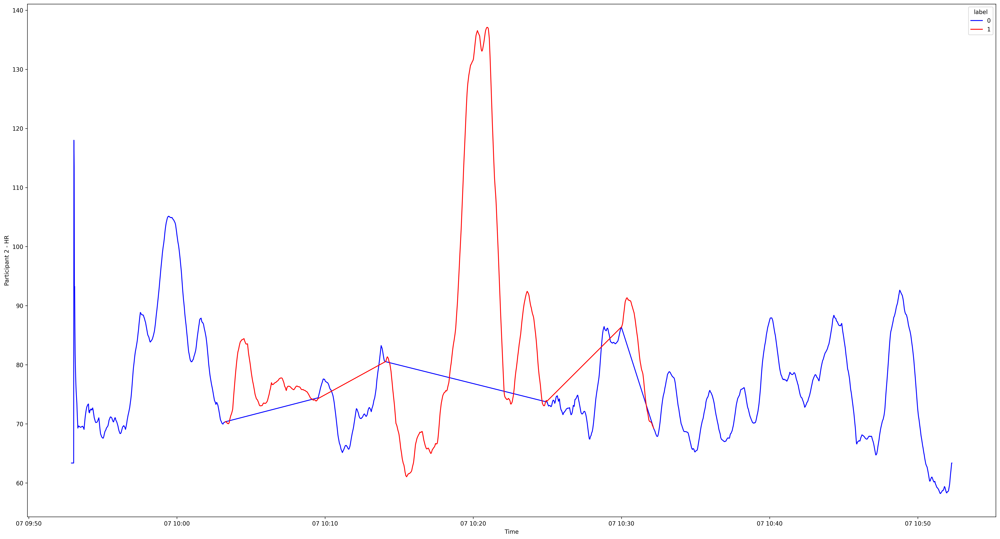

In [56]:
plot_participant_progression(data, 2, 'HR')

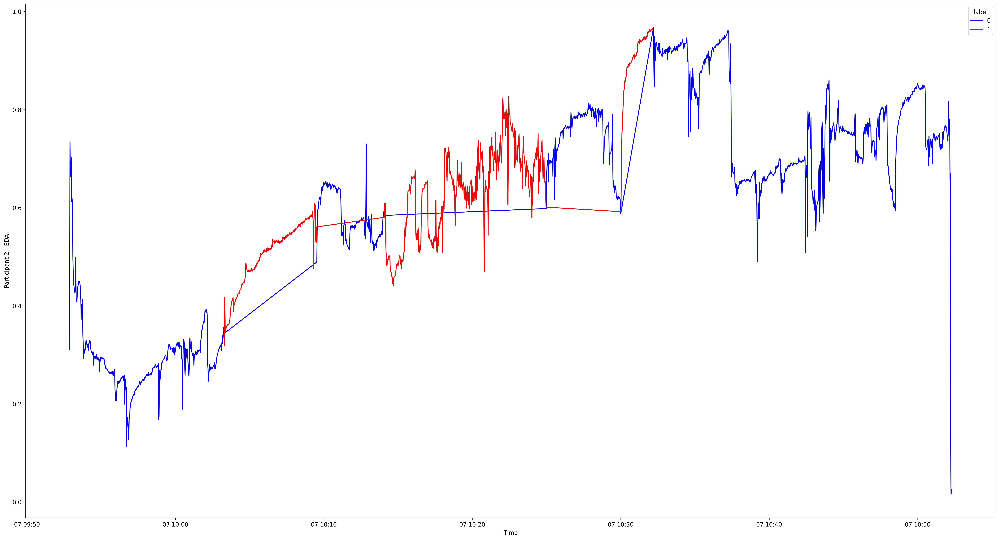

In [57]:
plot_participant_progression(data, 2, 'EDA')

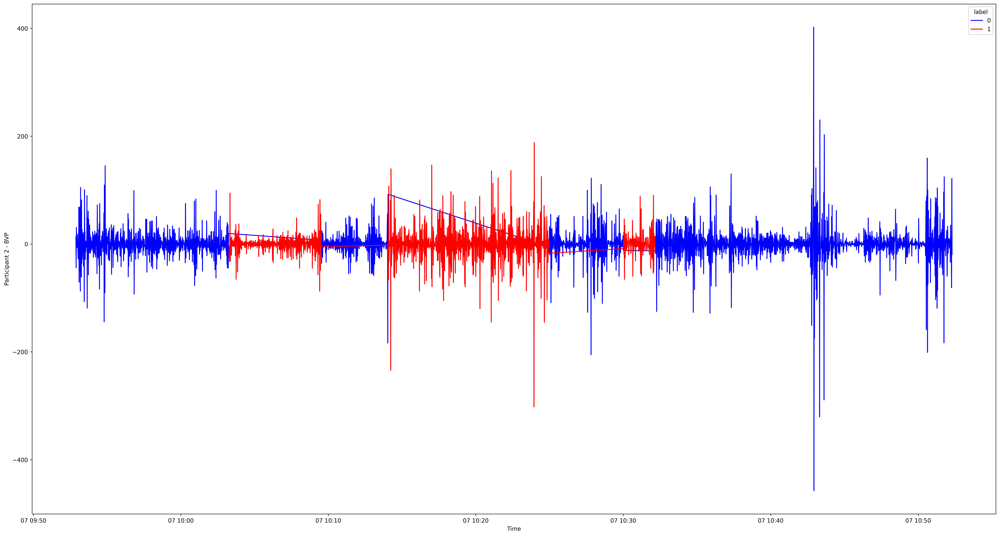

In [58]:
plot_participant_progression(data, 2, 'BVP')

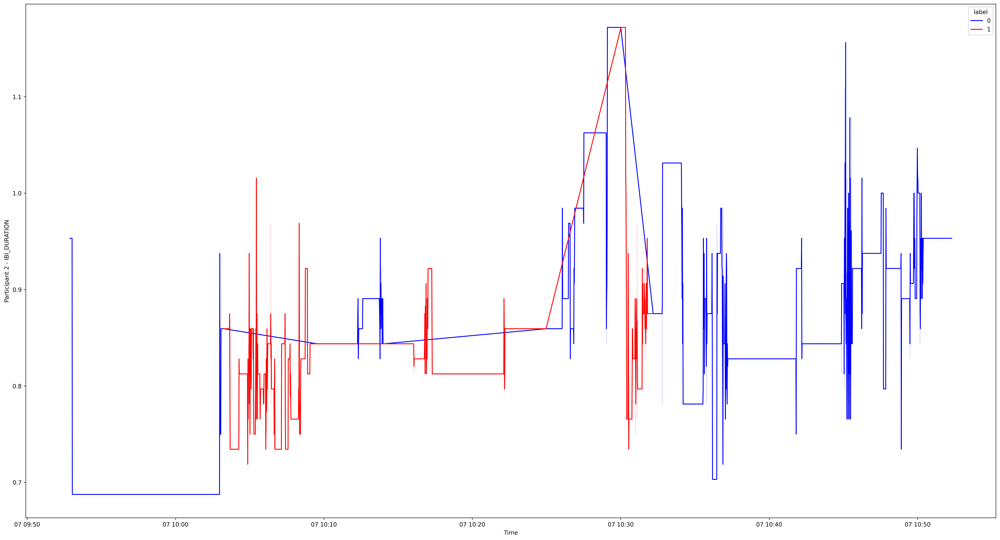

In [59]:
plot_participant_progression(data, 2, 'IBI_DURATION')

## Fill NaN values across participant features - Only for train participants

participant     0
HR              0
time            0
EDA             0
BVP             0
IBI_DURATION    0
TEMP            0
x               0
y               0
z               0
label           0
dtype: int64

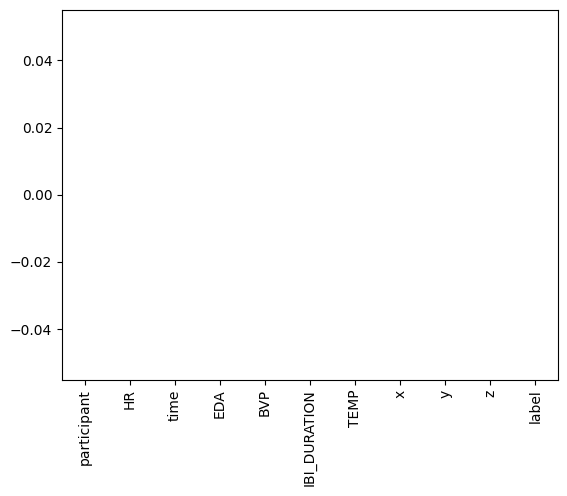

In [60]:
nan_barplot(get_participant_data(model_data, 4))
get_participant_data(model_data, 4).isnull().sum()

participant     0
HR              0
time            0
EDA             0
BVP             0
IBI_DURATION    0
TEMP            0
x               0
y               0
z               0
label           0
dtype: int64

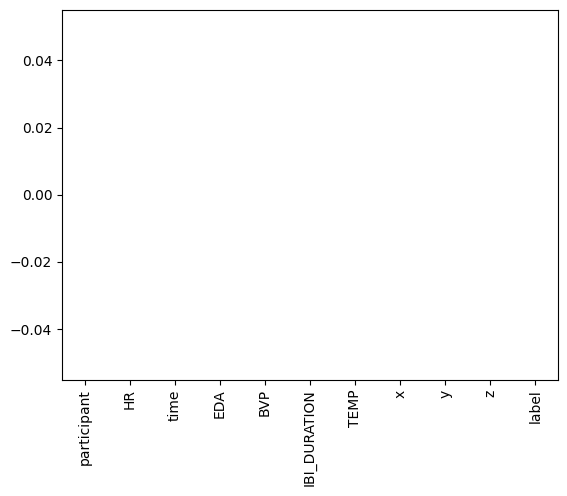

In [61]:
for participant in participants_train:
    model_data[participant]['data'].fillna(method='ffill', inplace=True)
    model_data[participant]['data'].fillna(method='bfill', inplace=True)

nan_barplot(get_participant_data(model_data, 4))
get_participant_data(model_data, 4).isnull().sum()

## Correlation Heatmap | Participants picked at random

**Only indicates linear relationship**

/var/folders/70/gdrkp9wd0hs9c065gdwqgfnw0000gn/T/ipykernel_32737/3343581981.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(get_participant_data(model_data, 4).corr(), annot=True)


<Axes: >

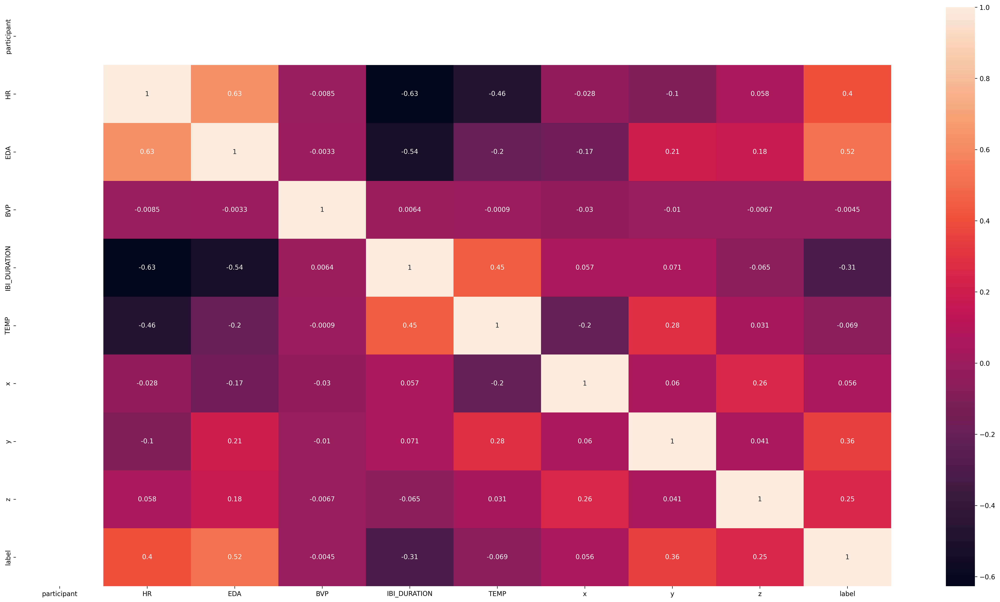

In [62]:
plt.figure(figsize=(30,16), dpi=300)
sns.heatmap(get_participant_data(model_data, 4).corr(), annot=True)

**Participant 4 shows a notable change in EDA, HR and y-axis (ACC) readings when under stress**

/var/folders/70/gdrkp9wd0hs9c065gdwqgfnw0000gn/T/ipykernel_32737/3857141369.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(get_participant_data(model_data, 2).corr(), annot=True)


<Axes: >

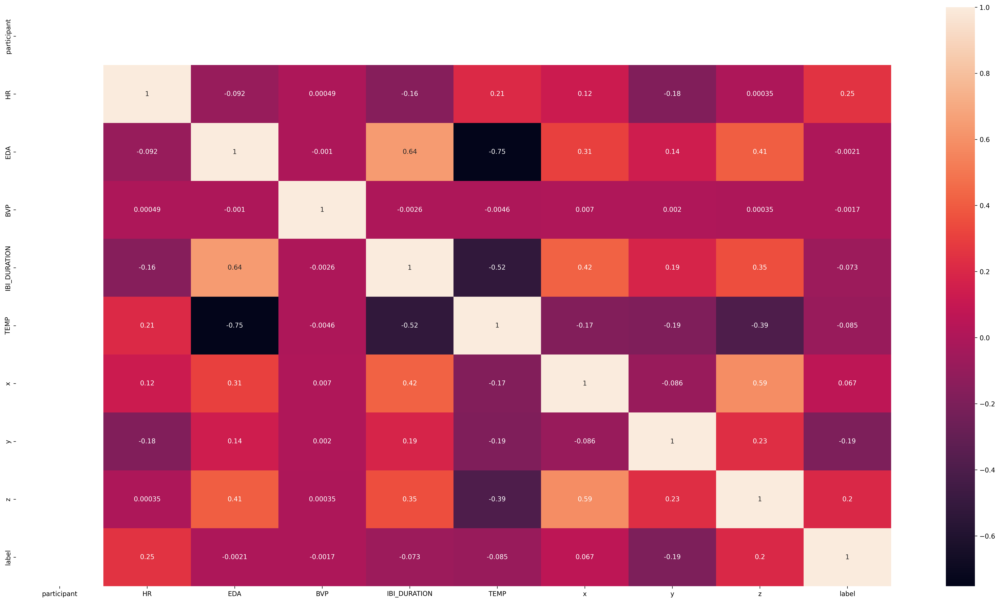

In [63]:
plt.figure(figsize=(30,16), dpi=300)
sns.heatmap(get_participant_data(model_data, 2).corr(), annot=True)

**Participant 2 shows a slight change in HR and z-axis (ACC) readings when under stress**

/var/folders/70/gdrkp9wd0hs9c065gdwqgfnw0000gn/T/ipykernel_32737/873659499.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(get_participant_data(model_data, 22).corr(), annot=True)


<Axes: >

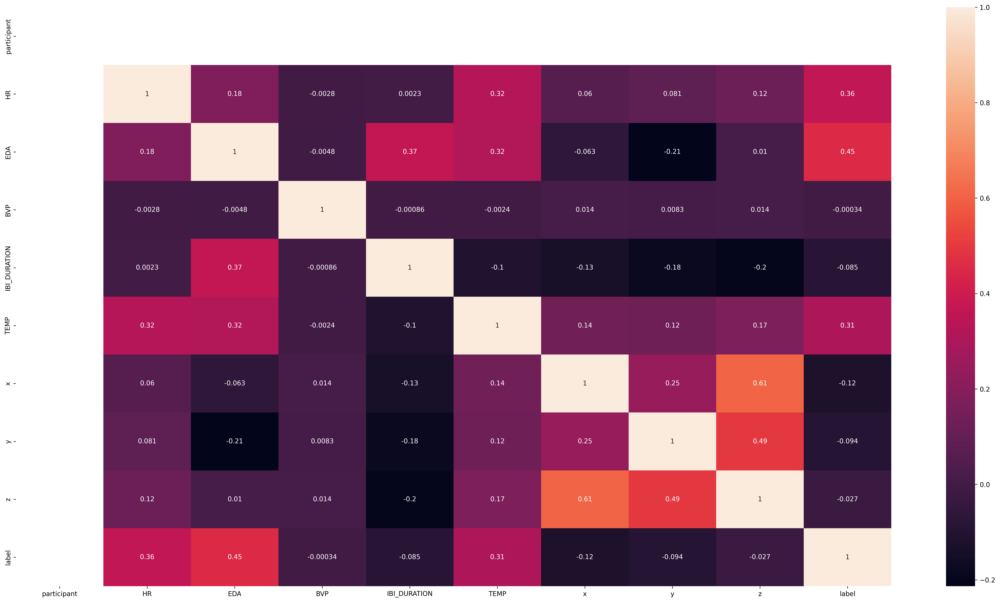

In [64]:
plt.figure(figsize=(30,16), dpi=300)
sns.heatmap(get_participant_data(model_data, 22).corr(), annot=True)

**Participant 22 shows a notable change in EDA, HR and TEMP readings when under stress**

/var/folders/70/gdrkp9wd0hs9c065gdwqgfnw0000gn/T/ipykernel_32737/1719884231.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(get_participant_data(model_data, 14).corr(), annot=True)


<Axes: >

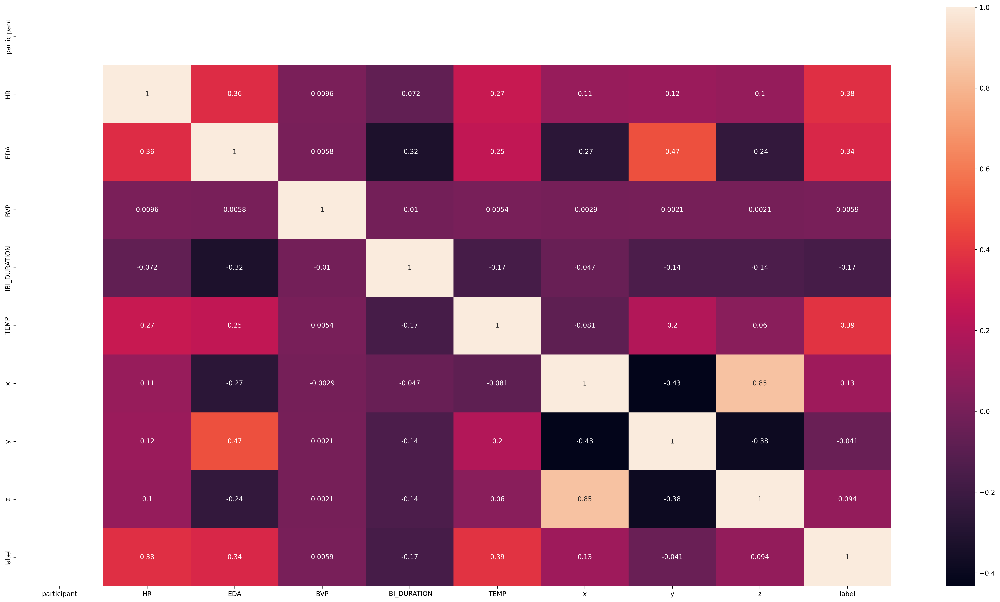

In [65]:
plt.figure(figsize=(30,16), dpi=300)
sns.heatmap(get_participant_data(model_data, 14).corr(), annot=True)

**Participant 14 shows a notable change in EDA, HR and TEMP readings when under stress**

# NOTE:

**The above plots confirm that different participants have different responses to stress and at varying intensities. On average, participants respond with a rise in temperature, electrodermal activity (increased sweat), and z-axis (deeper breaths). However, this is not always the case.**

**As a result, every participant will need to have a personalized model trained to monitor their individual stress responses and ALL features will have to be retained.**



# Prepare data for models | Use train participants

In [254]:
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, RandomizedSearchCV, StratifiedKFold

tscv = TimeSeriesSplit(gap=2)
for i, (train_index, test_index) in enumerate(tscv.split(X_train)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

In [615]:
def slice_train_test(data, test_proportion, chunk_size=100):
    if chunk_size < 2:
        print('Invalid chunk_size. Has to be a minimum of 2')
        return None, None
    if data is None:
        print('No data provided')
        return None, None
    if test_proportion >= 1 or test_proportion <= 0:
        print('Invalid test proportion')
        return None, None
    
    data.fillna(method='ffill', inplace=True)
    data.fillna(method='bfill', inplace=True)
    n_rows = data.shape[0]
    print('Total number of rows:', n_rows)
    train = pd.DataFrame()
    test = pd.DataFrame()
    
    if chunk_size > n_rows:
        chunk_size = int(n_rows // 10)
        print('Chunk size > Number of rows. Setting chunk size to', chunk_size)
    count = 0
    start_index = 0
    #chunk_size = 100
    len_test_slice = (abs(int(test_proportion*100)) / 100) * chunk_size
    len_train_slice = abs(int(chunk_size - len_test_slice))
    #print(len_train_slice)
    print('Splitting data into train-test slices',chunk_size,'rows at a time')
    print('Train size:',len_train_slice,'\nTest size:',chunk_size-len_train_slice)
    for index in range(0, n_rows, chunk_size):
        if index == 0:
            continue
        else:
            count += 1
            #print(start_index, index)
            data_slice = data.iloc[start_index: chunk_size + start_index]
            data_slice.reset_index(drop=True, inplace=True)
            #print(len(data_slice))
            
            train_slice = data_slice.iloc[:len_train_slice]
            test_slice = data_slice.iloc[len_train_slice:]
            start_index = index

            #print(index, len(train_slice), len(test_slice), start_index)
            
            train = pd.concat([train, train_slice], ignore_index=True)
            test = pd.concat([test, test_slice], ignore_index=True)
            
            n_leftovers = len(data) - (len(train)+len(test))
    print('Iter count:', count)
    if n_leftovers > 0:
        print('Leftover rows:', n_leftovers, '\nMoving into train set...\n')
        leftovers = data[len(data)-n_leftovers:]
        train = pd.concat([train, leftovers], ignore_index=True)
    train.reset_index(drop=True, inplace=True)
    test.reset_index(drop=True, inplace=True)
    print('Train value counts: \n',train['label'].value_counts())
    print('Test value counts: \n',test['label'].value_counts())
    print('-'*100)
    if len(train) + len(test) == n_rows:
        return train, test
    else:
        print('Row count mismatch!')
        return None, None
    

In [619]:
pd.options.display.max_rows = 999
train, test = slice_train_test(model_data[3]['data'], 0.2, np.inf)

Total number of rows: 3549
Chunk size > Number of rows. Setting chunk size to 354
Splitting data into train-test slices 354 rows at a time
Train size: 283 
Test size: 71
Iter count: 10
Leftover rows: 9 
Moving into train set...

Train value counts: 
 0    1997
1     842
Name: label, dtype: int64
Test value counts: 
 0    497
1    213
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------


In [620]:
def run_model(model_dict=None, model_data=None, participant_id=None, scale=False):
    if model_dict == None or model_data == None or participant_id == None:
        print('Invalid arguments')
        return None
    model = None
    params = None
    rscv = None 
    participant_data = model_data[participant_id]['data']
    model = model_dict['model']
    params = model_dict['params']

    print('='*100)
    print("PARTICIPANT", participant_id)
    print('='*100)
    
    train, test = slice_train_test(participant_data, 0.2, np.inf)
    X_train = train.drop(['label', 'time', 'participant'], axis=1)
    X_test = test.drop(['label', 'time', 'participant'], axis=1)
    y_train = train['label']
    y_test = test['label']
    
    if scale == True:
        print('Scaling data...')
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
    
    
    #tscv = TimeSeriesSplit(n_splits=2)
    #scorer = skl.Skcore.make_scorer(recall_score)
    rscv = RandomizedSearchCV(model, scoring='accuracy', cv=tscv, 
                              param_distributions=params, refit=True, 
                              n_jobs=-1, random_state=RANDOM_STATE, 
                              return_train_score=True, verbose=1)
    print('Running RandomizedSearchCV')
    rscv.fit(X_train, y_train)
    print('Model scorer:', rscv.scorer_)
    best_model = rscv.best_estimator_
    print('Best params:', rscv.best_params_)
    rscv_results = pd.DataFrame(rscv.cv_results_)
    print('RSCV: Mean Train Score:',np.mean(rscv_results['mean_train_score']))
    print('RSCV: Mean Test Score:',np.mean(rscv_results['mean_test_score']))
    #display(rscv_results)
    y_preds = best_model.predict(X_test)
    print(classification_report(y_test, y_preds))
    metrics_dict = evaluate_preds(y_preds, y_test)
    #plot_conf_mat(confusion_matrix(y_test, y_preds))
    print(confusion_matrix(y_test, y_preds))
    return best_model



# ML Models

Priority given to recall score - false negatives are more detrimental

In [562]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler

classifier_dictionary = {
    "Random Forest": {'model': RandomForestClassifier(random_state=RANDOM_STATE), 
                      'params': {
                          "max_depth": range(5, 30, 5), 
                          "min_samples_leaf": range(1, 30, 2),
                          "n_estimators": range(100, 2000, 200)}},
    "Gradient Boosting Classifier": {'model': GradientBoostingClassifier(random_state=RANDOM_STATE), 
                      'params': {
                          "learning_rate": [0.001, 0.01, 0.1], 
                          "n_estimators": range(1000, 3000, 200)}},
    "Linear SVM": {'model': SVC(random_state=RANDOM_STATE), 
                      'params': {
                          "kernel": ["rbf", "poly"], 
                          "gamma": ["auto", "scale"], 
                          "degree": range(1, 6, 1)}},
    "Nearest Neighbors": {'model': KNeighborsClassifier(), 
                      'params': {
                          'n_neighbors': [3, 5, 11, 19], 
                          'weights': ['uniform', 'distance'], 
                          'metric': ['euclidean', 'manhattan']}},
    "XGBoost": {'model': XGBClassifier(), 
                      'params': {
                        'min_child_weight': [1, 5, 10],
                        'gamma': [0.5, 1, 1.5, 2, 5],
                        'subsample': [0.6, 0.8, 1.0],
                        'colsample_bytree': [0.6, 0.8, 1.0],
                        'max_depth': [3, 4, 5], "n_estimators": [300, 600],
                        "learning_rate": [0.001, 0.01, 0.1]}}
}

# Gradient Boosting Classifier

Gradient Boosting Classifier
PARTICIPANT 29
Total number of rows: 3774
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 74 
Moving into train set...

Train value counts: 
 0    2039
1     995
Name: label, dtype: int64
Test value counts: 
 0    484
1    256
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 440, in fit
    y = self._validate_y(y, sample_weight)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 1232, in _validate_y
    raise ValueError(
Valu

Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 1200, 'learning_rate': 0.01}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       484
           1       0.98      0.88      0.93       256

    accuracy                           0.95       740
   macro avg       0.96      0.94      0.95       740
weighted avg       0.96      0.95      0.95       740

Accuracy: 95.41%
Precision: 0.98
Recall: 0.88
F1 score: 0.93


[[480   4]
 [ 30 226]]



Gradient Boosting Classifier
PARTICIPANT 31
Total number of rows: 3717
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 17 
Moving into train set...

Train value counts: 
 0    2000
1     977
Name: label, dtype: int64
Test value counts: 
 0    488
1    252
Name: label, dtype: int64
--------------------------------------------------------------------------------------------

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 440, in fit
    y = self._validate_y(y, sample_weight)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 1232, in _validate_y
    raise ValueError(
Valu

Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 1200, 'learning_rate': 0.01}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       488
           1       0.99      0.92      0.95       252

    accuracy                           0.97       740
   macro avg       0.97      0.96      0.97       740
weighted avg       0.97      0.97      0.97       740

Accuracy: 97.03%
Precision: 0.99
Recall: 0.92
F1 score: 0.95


[[485   3]
 [ 19 233]]



Gradient Boosting Classifier
PARTICIPANT 32
Total number of rows: 3219
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 19 
Moving into train set...

Train value counts: 
 0    1710
1     869
Name: label, dtype: int64
Test value counts: 
 0    417
1    223
Name: label, dtype: int64
--------------------------------------------------------------------------------------------

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 440, in fit
    y = self._validate_y(y, sample_weight)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 1232, in _validate_y
    raise ValueError(
Valu

Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 1200, 'learning_rate': 0.01}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       417
           1       0.87      0.87      0.87       223

    accuracy                           0.91       640
   macro avg       0.90      0.90      0.90       640
weighted avg       0.91      0.91      0.91       640

Accuracy: 91.09%
Precision: 0.87
Recall: 0.87
F1 score: 0.87


[[388  29]
 [ 28 195]]



Gradient Boosting Classifier
PARTICIPANT 33
Total number of rows: 3966
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 66 
Moving into train set...

Train value counts: 
 0    2049
1    1137
Name: label, dtype: int64
Test value counts: 
 0    485
1    295
Name: label, dtype: int64
--------------------------------------------------------------------------------------------

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 440, in fit
    y = self._validate_y(y, sample_weight)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 1232, in _validate_y
    raise ValueError(
Valu

Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 1200, 'learning_rate': 0.01}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       485
           1       0.96      0.94      0.95       295

    accuracy                           0.96       780
   macro avg       0.96      0.96      0.96       780
weighted avg       0.96      0.96      0.96       780

Accuracy: 96.15%
Precision: 0.96
Recall: 0.94
F1 score: 0.95


[[474  11]
 [ 19 276]]



Gradient Boosting Classifier
PARTICIPANT 34
Total number of rows: 4624
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 24 
Moving into train set...

Train value counts: 
 0    2564
1    1140
Name: label, dtype: int64
Test value counts: 
 0    633
1    287
Name: label, dtype: int64
--------------------------------------------------------------------------------------------

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 440, in fit
    y = self._validate_y(y, sample_weight)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py", line 1232, in _validate_y
    raise ValueError(
Valu

Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 1200, 'learning_rate': 0.01}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       633
           1       1.00      0.95      0.97       287

    accuracy                           0.98       920
   macro avg       0.99      0.97      0.98       920
weighted avg       0.98      0.98      0.98       920

Accuracy: 98.26%
Precision: 1.00
Recall: 0.95
F1 score: 0.97


[[632   1]
 [ 15 272]]



Gradient Boosting Classifier
PARTICIPANT 35
Total number of rows: 3645
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 45 
Moving into train set...

Train value counts: 
 0    1957
1     968
Name: label, dtype: int64
Test value counts: 
 0    486
1    234
Name: label, dtype: int64
--------------------------------------------------------------------------------------------

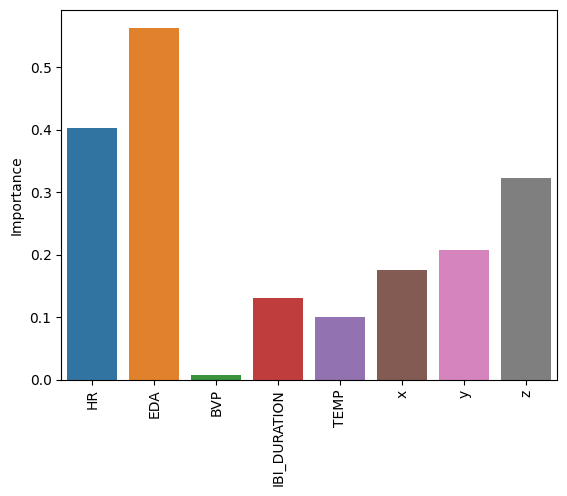

In [521]:
for participant in participants_test:
    print('='*100)
    print('Gradient Boosting Classifier')
    model = run_model(model_dict=classifier_dictionary['Gradient Boosting Classifier'], model_data=model_data, participant_id=participant, scale=False)
    print('\n\n')
    get_feature_importance_graph(model.feature_importances_)
    

# KNN Classifier

In [621]:
for participant in participants:
    print('='*100)
    print('KNN Classifier')
    model = run_model(model_dict=classifier_dictionary['Nearest Neighbors'], model_data=model_data, participant_id=participant, scale=True)
    print('\n\n')

KNN Classifier
PARTICIPANT 2
Total number of rows: 3611
Chunk size > Number of rows. Setting chunk size to 361
Splitting data into train-test slices 361 rows at a time
Train size: 288 
Test size: 73
Iter count: 10
Leftover rows: 1 
Moving into train set...

Train value counts: 
 0    1915
1     966
Name: label, dtype: int64
Test value counts: 
 0    511
1    219
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling data...
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'uniform', 'n_neighbors': 11, 'metric': 'euclidean'}
RSCV: Mean Train Score: 0.990721800416407
RSCV: Mean Test Score: 0.39058333333333334
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       511
           1       0.96      0.72      0.82       219

    accuracy                       

Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'distance', 'n_neighbors': 11, 'metric': 'euclidean'}
RSCV: Mean Train Score: 0.9942895092341129
RSCV: Mean Test Score: 0.6197752808988763
              precision    recall  f1-score   support

           0       1.00      0.95      0.97       560
           1       0.90      1.00      0.94       240

    accuracy                           0.96       800
   macro avg       0.95      0.97      0.96       800
weighted avg       0.97      0.96      0.97       800

Accuracy: 96.50%
Precision: 0.90
Recall: 1.00
F1 score: 0.94


[[533  27]
 [  1 239]]



KNN Classifier
PARTICIPANT 9
Total number of rows: 4149
Chunk size > Number of rows. Setting chunk size to 414
Splitting data into train-test slices 414 rows at a time
Train size: 331 
Test size: 83
Iter count: 10
Leftover rows: 9 
Moving into train set...

Train value counts: 
 0    2248
1    1071
Name: label, dtype: int64
Test value counts: 
 0    687
1    143
Name: label, 

Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'uniform', 'n_neighbors': 11, 'metric': 'euclidean'}
RSCV: Mean Train Score: 0.9955364679710262
RSCV: Mean Test Score: 0.6700187617260788
              precision    recall  f1-score   support

           0       0.83      0.96      0.89       489
           1       0.93      0.70      0.80       321

    accuracy                           0.86       810
   macro avg       0.88      0.83      0.84       810
weighted avg       0.87      0.86      0.85       810

Accuracy: 85.93%
Precision: 0.93
Recall: 0.70
F1 score: 0.80


[[471  18]
 [ 96 225]]



KNN Classifier
PARTICIPANT 15
Total number of rows: 3659
Chunk size > Number of rows. Setting chunk size to 365
Splitting data into train-test slices 365 rows at a time
Train size: 292 
Test size: 73
Iter count: 10
Leftover rows: 9 
Moving into train set...

Train value counts: 
 0    1985
1     944
Name: label, dtype: int64
Test value counts: 
 0    485
1    245
Name: label, 

Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'uniform', 'n_neighbors': 19, 'metric': 'euclidean'}
RSCV: Mean Train Score: 0.9895256010502715
RSCV: Mean Test Score: 0.6065411764705881
              precision    recall  f1-score   support

           0       0.85      0.94      0.89       407
           1       0.87      0.71      0.78       233

    accuracy                           0.86       640
   macro avg       0.86      0.83      0.84       640
weighted avg       0.86      0.86      0.85       640

Accuracy: 85.78%
Precision: 0.87
Recall: 0.71
F1 score: 0.78


[[383  24]
 [ 67 166]]



KNN Classifier
PARTICIPANT 23
Total number of rows: 3210
Chunk size > Number of rows. Setting chunk size to 321
Splitting data into train-test slices 321 rows at a time
Train size: 256 
Test size: 65
Iter count: 9
Leftover rows: 321 
Moving into train set...

Train value counts: 
 0    1712
1     913
Name: label, dtype: int64
Test value counts: 
 0    366
1    219
Name: label,

Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'uniform', 'n_neighbors': 11, 'metric': 'euclidean'}
RSCV: Mean Train Score: 0.9936584087511401
RSCV: Mean Test Score: 0.47206971677559917
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       368
           1       0.80      0.86      0.83       244

    accuracy                           0.86       612
   macro avg       0.85      0.86      0.86       612
weighted avg       0.86      0.86      0.86       612

Accuracy: 85.95%
Precision: 0.80
Recall: 0.86
F1 score: 0.83


[[316  52]
 [ 34 210]]



KNN Classifier
PARTICIPANT 29
Total number of rows: 3774
Chunk size > Number of rows. Setting chunk size to 377
Splitting data into train-test slices 377 rows at a time
Train size: 301 
Test size: 76
Iter count: 10
Leftover rows: 4 
Moving into train set...

Train value counts: 
 0    2015
1     999
Name: label, dtype: int64
Test value counts: 
 0    508
1    252
Name: label,

Model scorer: make_scorer(accuracy_score)
Best params: {'weights': 'uniform', 'n_neighbors': 19, 'metric': 'manhattan'}
RSCV: Mean Train Score: 0.9948958662075299
RSCV: Mean Test Score: 0.4275876288659794
              precision    recall  f1-score   support

           0       0.86      0.97      0.91       453
           1       0.93      0.75      0.83       277

    accuracy                           0.88       730
   macro avg       0.90      0.86      0.87       730
weighted avg       0.89      0.88      0.88       730

Accuracy: 88.49%
Precision: 0.93
Recall: 0.75
F1 score: 0.83


[[438  15]
 [ 69 208]]





# Support Vector Classifier

In [514]:
for participant in participants:
    print('='*100)
    print('Linear SVM')
    model = run_model(model_dict=classifier_dictionary['Linear SVM'], model_data=model_data, participant_id=participant, scale=True)
    print('\n\n')

Linear SVM
PARTICIPANT 2
Total number of rows: 3611
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 11 
Moving into train set...

Train value counts: 
 0    1946
1     945
Name: label, dtype: int64
Test value counts: 
 0    480
1    240
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling data...
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       480
           1       0.96      0.82      0.89       240

    accuracy                           0.93       720
   macro avg       0.94      0.90      0.92       720
weighted avg       0.93      0.93      0.93       720

Accuracy: 92.92%
Precision: 0.96
Recall: 0.82
F1 score: 0.89


[[471   9]
 [ 42 198]]



Linear SVM
PARTICIPANT 3
Total number of rows: 3549
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 49 
Moving into train set...

Train value counts: 
 0    2011
1     838
Name: label, dtype: int64
Test value counts: 
 0    483
1    217
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       483
           1       0.93      0.68      0.79       217

    accuracy                           0.88       700
   macro avg       0.90      0.83      0.85       700
weighted avg       0.89      0.88      0.88       700

Accuracy: 88.43%
Precision: 0.93
Recall: 0.68
F1 score: 0.79


[[471  12]
 [ 69 148]]



Linear SVM
PARTICIPANT 4
Total number of rows: 3864
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 64 
Moving into train set...

Train value counts: 
 0    2160
1     944
Name: label, dtype: int64
Test value counts: 
 0    521
1    239
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       521
           1       0.80      0.92      0.85       239

    accuracy                           0.90       760
   macro avg       0.88      0.90      0.89       760
weighted avg       0.91      0.90      0.90       760

Accuracy: 90.00%
Precision: 0.80
Recall: 0.92
F1 score: 0.85


[[465  56]
 [ 20 219]]



Linear SVM
PARTICIPANT 5
Total number of rows: 3929
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 29 
Moving into train set...

Train value counts: 
 0    2088
1    1061
Name: label, dtype: int64
Test value counts: 
 0    500
1    280
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       500
           1       0.97      0.97      0.97       280

    accuracy                           0.98       780
   macro avg       0.98      0.98      0.98       780
weighted avg       0.98      0.98      0.98       780

Accuracy: 98.21%
Precision: 0.97
Recall: 0.97
F1 score: 0.97


[[493   7]
 [  7 273]]



Linear SVM
PARTICIPANT 7
Total number of rows: 3700
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 100 
Moving into train set...

Train value counts: 
 0    2114
1     866
Name: label, dtype: int64
Test value counts: 
 0    496
1    224
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.86      0.92      0.89       496
           1       0.79      0.67      0.72       224

    accuracy                           0.84       720
   macro avg       0.82      0.79      0.81       720
weighted avg       0.84      0.84      0.84       720

Accuracy: 84.17%
Precision: 0.79
Recall: 0.67
F1 score: 0.72


[[456  40]
 [ 74 150]]



Linear SVM
PARTICIPANT 8
Total number of rows: 4007
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 7 
Moving into train set...

Train value counts: 
 0    2141
1    1066
Name: label, dtype: int64
Test value counts: 
 0    547
1    253
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling 

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       547
           1       0.93      0.95      0.94       253

    accuracy                           0.96       800
   macro avg       0.95      0.96      0.96       800
weighted avg       0.96      0.96      0.96       800

Accuracy: 96.25%
Precision: 0.93
Recall: 0.95
F1 score: 0.94


[[530  17]
 [ 13 240]]



Linear SVM
PARTICIPANT 9
Total number of rows: 4149
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 49 
Moving into train set...

Train value counts: 
 0    2347
1     982
Name: label, dtype: int64
Test value counts: 
 0    588
1    232
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       588
           1       0.89      0.88      0.89       232

    accuracy                           0.94       820
   macro avg       0.92      0.92      0.92       820
weighted avg       0.94      0.94      0.94       820

Accuracy: 93.54%
Precision: 0.89
Recall: 0.88
F1 score: 0.89


[[563  25]
 [ 28 204]]



Linear SVM
PARTICIPANT 10
Total number of rows: 3325
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 25 
Moving into train set...

Train value counts: 
 0    1773
1     892
Name: label, dtype: int64
Test value counts: 
 0    428
1    232
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       428
           1       0.95      0.95      0.95       232

    accuracy                           0.96       660
   macro avg       0.96      0.96      0.96       660
weighted avg       0.96      0.96      0.96       660

Accuracy: 96.36%
Precision: 0.95
Recall: 0.95
F1 score: 0.95


[[416  12]
 [ 12 220]]



Linear SVM
PARTICIPANT 11
Total number of rows: 3888
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 88 
Moving into train set...

Train value counts: 
 0    2047
1    1081
Name: label, dtype: int64
Test value counts: 
 0    462
1    298
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.92      0.97      0.95       462
           1       0.95      0.88      0.91       298

    accuracy                           0.93       760
   macro avg       0.94      0.92      0.93       760
weighted avg       0.94      0.93      0.93       760

Accuracy: 93.42%
Precision: 0.95
Recall: 0.88
F1 score: 0.91


[[449  13]
 [ 37 261]]



Linear SVM
PARTICIPANT 12
Total number of rows: 3507
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 7 
Moving into train set...

Train value counts: 
 0    1852
1     955
Name: label, dtype: int64
Test value counts: 
 0    479
1    221
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       479
           1       0.96      1.00      0.98       221

    accuracy                           0.98       700
   macro avg       0.98      0.99      0.98       700
weighted avg       0.98      0.98      0.98       700

Accuracy: 98.43%
Precision: 0.96
Recall: 1.00
F1 score: 0.98


[[469  10]
 [  1 220]]



Linear SVM
PARTICIPANT 13
Total number of rows: 3582
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 82 
Moving into train set...

Train value counts: 
 0    1848
1    1034
Name: label, dtype: int64
Test value counts: 
 0    440
1    260
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       440
           1       0.93      0.94      0.93       260

    accuracy                           0.95       700
   macro avg       0.95      0.95      0.95       700
weighted avg       0.95      0.95      0.95       700

Accuracy: 95.14%
Precision: 0.93
Recall: 0.94
F1 score: 0.93


[[422  18]
 [ 16 244]]



Linear SVM
PARTICIPANT 14
Total number of rows: 4013
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 13 
Moving into train set...

Train value counts: 
 0    2195
1    1018
Name: label, dtype: int64
Test value counts: 
 0    540
1    260
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       540
           1       0.95      0.86      0.90       260

    accuracy                           0.94       800
   macro avg       0.94      0.92      0.93       800
weighted avg       0.94      0.94      0.94       800

Accuracy: 93.88%
Precision: 0.95
Recall: 0.86
F1 score: 0.90


[[528  12]
 [ 37 223]]



Linear SVM
PARTICIPANT 15
Total number of rows: 3659
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 59 
Moving into train set...

Train value counts: 
 0    1989
1     950
Name: label, dtype: int64
Test value counts: 
 0    481
1    239
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       481
           1       0.92      0.95      0.94       239

    accuracy                           0.96       720
   macro avg       0.95      0.96      0.95       720
weighted avg       0.96      0.96      0.96       720

Accuracy: 95.69%
Precision: 0.92
Recall: 0.95
F1 score: 0.94


[[461  20]
 [ 11 228]]



Linear SVM
PARTICIPANT 16
Total number of rows: 3658
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 58 
Moving into train set...

Train value counts: 
 0    2047
1     891
Name: label, dtype: int64
Test value counts: 
 0    520
1    200
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       520
           1       0.83      0.83      0.83       200

    accuracy                           0.91       720
   macro avg       0.88      0.88      0.88       720
weighted avg       0.91      0.91      0.91       720

Accuracy: 90.56%
Precision: 0.83
Recall: 0.83
F1 score: 0.83


[[485  35]
 [ 33 167]]



Linear SVM
PARTICIPANT 19
Total number of rows: 3367
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 67 
Moving into train set...

Train value counts: 
 0    1883
1     824
Name: label, dtype: int64
Test value counts: 
 0    460
1    200
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       460
           1       1.00      0.93      0.96       200

    accuracy                           0.98       660
   macro avg       0.99      0.97      0.97       660
weighted avg       0.98      0.98      0.98       660

Accuracy: 97.88%
Precision: 1.00
Recall: 0.93
F1 score: 0.96


[[460   0]
 [ 14 186]]



Linear SVM
PARTICIPANT 20
Total number of rows: 3655
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 55 
Moving into train set...

Train value counts: 
 0    2043
1     892
Name: label, dtype: int64
Test value counts: 
 0    500
1    220
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       500
           1       0.87      0.90      0.89       220

    accuracy                           0.93       720
   macro avg       0.92      0.92      0.92       720
weighted avg       0.93      0.93      0.93       720

Accuracy: 93.06%
Precision: 0.87
Recall: 0.90
F1 score: 0.89


[[471  29]
 [ 21 199]]



Linear SVM
PARTICIPANT 21
Total number of rows: 3415
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 15 
Moving into train set...

Train value counts: 
 0    1775
1     960
Name: label, dtype: int64
Test value counts: 
 0    440
1    240
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       440
           1       1.00      0.99      0.99       240

    accuracy                           1.00       680
   macro avg       1.00      0.99      1.00       680
weighted avg       1.00      1.00      1.00       680

Accuracy: 99.56%
Precision: 1.00
Recall: 0.99
F1 score: 0.99


[[439   1]
 [  2 238]]



Linear SVM
PARTICIPANT 22
Total number of rows: 3193
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 93 
Moving into train set...

Train value counts: 
 0    1647
1     926
Name: label, dtype: int64
Test value counts: 
 0    381
1    239
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       381
           1       0.84      0.90      0.87       239

    accuracy                           0.90       620
   macro avg       0.89      0.90      0.89       620
weighted avg       0.90      0.90      0.90       620

Accuracy: 89.84%
Precision: 0.84
Recall: 0.90
F1 score: 0.87


[[341  40]
 [ 23 216]]



Linear SVM
PARTICIPANT 23
Total number of rows: 3210
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 10 
Moving into train set...

Train value counts: 
 0    1665
1     905
Name: label, dtype: int64
Test value counts: 
 0    413
1    227
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       413
           1       0.96      0.94      0.95       227

    accuracy                           0.97       640
   macro avg       0.97      0.96      0.96       640
weighted avg       0.97      0.97      0.97       640

Accuracy: 96.56%
Precision: 0.96
Recall: 0.94
F1 score: 0.95


[[405   8]
 [ 14 213]]



Linear SVM
PARTICIPANT 24
Total number of rows: 3717
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 17 
Moving into train set...

Train value counts: 
 0    1970
1    1007
Name: label, dtype: int64
Test value counts: 
 0    480
1    260
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scaling data...
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       480
           1       0.93      0.94      0.93       260

    accuracy                           0.95       740
   macro avg       0.95      0.95      0.95       740
weighted avg       0.95      0.95      0.95       740

Accuracy: 95.41%
Precision: 0.93
Recall: 0.94
F1 score: 0.93


[[462  18]
 [ 16 244]]



Linear SVM
PARTICIPANT 25
Total number of rows: 3287
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 87 
Moving into train set...

Train value counts: 
 0    1793
1     854
Name: label, dtype: int64
Test value counts: 
 0    420
1    220
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       420
           1       0.97      1.00      0.98       220

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640

Accuracy: 98.91%
Precision: 0.97
Recall: 1.00
F1 score: 0.98


[[414   6]
 [  1 219]]



Linear SVM
PARTICIPANT 26
Total number of rows: 3319
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 19 
Moving into train set...

Train value counts: 
 0    1749
1     910
Name: label, dtype: int64
Test value counts: 
 0    442
1    218
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       442
           1       0.93      0.94      0.93       218

    accuracy                           0.96       660
   macro avg       0.95      0.95      0.95       660
weighted avg       0.96      0.96      0.96       660

Accuracy: 95.61%
Precision: 0.93
Recall: 0.94
F1 score: 0.93


[[426  16]
 [ 13 205]]



Linear SVM
PARTICIPANT 27
Total number of rows: 3680
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 80 
Moving into train set...

Train value counts: 
 0    1899
1    1061
Name: label, dtype: int64
Test value counts: 
 0    461
1    259
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       461
           1       0.92      0.91      0.91       259

    accuracy                           0.94       720
   macro avg       0.93      0.93      0.93       720
weighted avg       0.94      0.94      0.94       720

Accuracy: 93.89%
Precision: 0.92
Recall: 0.91
F1 score: 0.91


[[441  20]
 [ 24 235]]



Linear SVM
PARTICIPANT 28
Total number of rows: 3370
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 70 
Moving into train set...

Train value counts: 
 0    1809
1     901
Name: label, dtype: int64
Test value counts: 
 0    440
1    220
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       440
           1       0.91      0.94      0.92       220

    accuracy                           0.95       660
   macro avg       0.94      0.94      0.94       660
weighted avg       0.95      0.95      0.95       660

Accuracy: 94.70%
Precision: 0.91
Recall: 0.94
F1 score: 0.92


[[419  21]
 [ 14 206]]



Linear SVM
PARTICIPANT 29
Total number of rows: 3774
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 74 
Moving into train set...

Train value counts: 
 0    2039
1     995
Name: label, dtype: int64
Test value counts: 
 0    484
1    256
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       484
           1       0.98      0.91      0.95       256

    accuracy                           0.96       740
   macro avg       0.97      0.95      0.96       740
weighted avg       0.96      0.96      0.96       740

Accuracy: 96.35%
Precision: 0.98
Recall: 0.91
F1 score: 0.95


[[479   5]
 [ 22 234]]



Linear SVM
PARTICIPANT 31
Total number of rows: 3717
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 17 
Moving into train set...

Train value counts: 
 0    2000
1     977
Name: label, dtype: int64
Test value counts: 
 0    488
1    252
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       488
           1       0.97      0.85      0.90       252

    accuracy                           0.94       740
   macro avg       0.95      0.92      0.93       740
weighted avg       0.94      0.94      0.94       740

Accuracy: 93.92%
Precision: 0.97
Recall: 0.85
F1 score: 0.90


[[482   6]
 [ 39 213]]



Linear SVM
PARTICIPANT 32
Total number of rows: 3219
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 19 
Moving into train set...

Train value counts: 
 0    1710
1     869
Name: label, dtype: int64
Test value counts: 
 0    417
1    223
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.91      0.96      0.94       417
           1       0.93      0.83      0.87       223

    accuracy                           0.92       640
   macro avg       0.92      0.90      0.91       640
weighted avg       0.92      0.92      0.92       640

Accuracy: 91.72%
Precision: 0.93
Recall: 0.83
F1 score: 0.87


[[402  15]
 [ 38 185]]



Linear SVM
PARTICIPANT 33
Total number of rows: 3966
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 66 
Moving into train set...

Train value counts: 
 0    2049
1    1137
Name: label, dtype: int64
Test value counts: 
 0    485
1    295
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       485
           1       0.93      0.94      0.93       295

    accuracy                           0.95       780
   macro avg       0.95      0.95      0.95       780
weighted avg       0.95      0.95      0.95       780

Accuracy: 95.00%
Precision: 0.93
Recall: 0.94
F1 score: 0.93


[[465  20]
 [ 19 276]]



Linear SVM
PARTICIPANT 34
Total number of rows: 4624
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 24 
Moving into train set...

Train value counts: 
 0    2564
1    1140
Name: label, dtype: int64
Test value counts: 
 0    633
1    287
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 201, in fit
    y = self._validate_targets(y)
  File "/Users/tacocat/miniconda/lib/python3.10/site-packages/sklearn/svm/_base.py", line 749, in _validate_targets
    raise ValueError(
ValueError: Th

Model scorer: make_scorer(accuracy_score)
Best params: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}
RSCV: Mean Train Score: nan
RSCV: Mean Test Score: nan
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       633
           1       0.96      0.90      0.93       287

    accuracy                           0.96       920
   macro avg       0.96      0.94      0.95       920
weighted avg       0.96      0.96      0.96       920

Accuracy: 95.76%
Precision: 0.96
Recall: 0.90
F1 score: 0.93


[[622  11]
 [ 28 259]]



Linear SVM
PARTICIPANT 35
Total number of rows: 3645
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 45 
Moving into train set...

Train value counts: 
 0    1957
1     968
Name: label, dtype: int64
Test value counts: 
 0    486
1    234
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Scalin

# XGBoost Classifier

XGBoost
PARTICIPANT 2
Total number of rows: 3611
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 11 
Moving into train set...

Train value counts: 
 0    1946
1     945
Name: label, dtype: int64
Test value counts: 
 0    480
1    240
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 0.6, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 1.5, 'colsample_bytree': 0.8}
RSCV: Mean Train Score: 0.9884096821112047
RSCV: Mean Test Score: 0.36557172557172557
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       480
           1       0.97      0.91      0.94       240

    accuracy                           0.96       72

Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 0.6, 'n_estimators': 600, 'min_child_weight': 5, 'max_depth': 4, 'learning_rate': 0.01, 'gamma': 1, 'colsample_bytree': 0.6}
RSCV: Mean Train Score: 0.9937269850983549
RSCV: Mean Test Score: 0.6396254681647939
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       547
           1       0.92      0.96      0.94       253

    accuracy                           0.96       800
   macro avg       0.95      0.96      0.96       800
weighted avg       0.96      0.96      0.96       800

Accuracy: 96.25%
Precision: 0.92
Recall: 0.96
F1 score: 0.94


[[526  21]
 [  9 244]]



XGBoost
PARTICIPANT 9
Total number of rows: 4149
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 49 
Moving into train set...

Train value counts: 
 0    2347
1     982
Name: label, dtype: int64
Test value counts: 
 0    588
1    232
Name: label, dtyp

Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 0.8, 'n_estimators': 600, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.001, 'gamma': 1.5, 'colsample_bytree': 1.0}
RSCV: Mean Train Score: 0.9915676418374233
RSCV: Mean Test Score: 0.4612336448598131
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       540
           1       0.94      0.79      0.86       260

    accuracy                           0.91       800
   macro avg       0.92      0.88      0.90       800
weighted avg       0.92      0.91      0.91       800

Accuracy: 91.38%
Precision: 0.94
Recall: 0.79
F1 score: 0.86


[[526  14]
 [ 55 205]]



XGBoost
PARTICIPANT 15
Total number of rows: 3659
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 59 
Moving into train set...

Train value counts: 
 0    1989
1     950
Name: label, dtype: int64
Test value counts: 
 0    481
1    239
Name: label, 

Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 0.8, 'n_estimators': 600, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.001, 'gamma': 1.5, 'colsample_bytree': 1.0}
RSCV: Mean Train Score: 0.9870381087734929
RSCV: Mean Test Score: 0.5713084112149532
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       381
           1       0.94      0.86      0.90       239

    accuracy                           0.92       620
   macro avg       0.93      0.91      0.92       620
weighted avg       0.92      0.92      0.92       620

Accuracy: 92.26%
Precision: 0.94
Recall: 0.86
F1 score: 0.90


[[367  14]
 [ 34 205]]



XGBoost
PARTICIPANT 23
Total number of rows: 3210
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 10 
Moving into train set...

Train value counts: 
 0    1665
1     905
Name: label, dtype: int64
Test value counts: 
 0    413
1    227
Name: label, 

Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 0.8, 'n_estimators': 600, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.001, 'gamma': 1.5, 'colsample_bytree': 1.0}
RSCV: Mean Train Score: 0.9890569799423055
RSCV: Mean Test Score: 0.4520177383592018
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       440
           1       0.91      0.95      0.93       220

    accuracy                           0.95       660
   macro avg       0.94      0.95      0.95       660
weighted avg       0.95      0.95      0.95       660

Accuracy: 95.15%
Precision: 0.91
Recall: 0.95
F1 score: 0.93


[[418  22]
 [ 10 210]]



XGBoost
PARTICIPANT 29
Total number of rows: 3774
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 74 
Moving into train set...

Train value counts: 
 0    2039
1     995
Name: label, dtype: int64
Test value counts: 
 0    484
1    256
Name: label, 

Model scorer: make_scorer(accuracy_score)
Best params: {'subsample': 1.0, 'n_estimators': 600, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.001, 'gamma': 0.5, 'colsample_bytree': 1.0}
RSCV: Mean Train Score: 0.9910905357655639
RSCV: Mean Test Score: 0.4719917864476385
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       486
           1       0.75      0.75      0.75       234

    accuracy                           0.84       720
   macro avg       0.81      0.81      0.81       720
weighted avg       0.84      0.84      0.84       720

Accuracy: 83.61%
Precision: 0.75
Recall: 0.75
F1 score: 0.75


[[427  59]
 [ 59 175]]





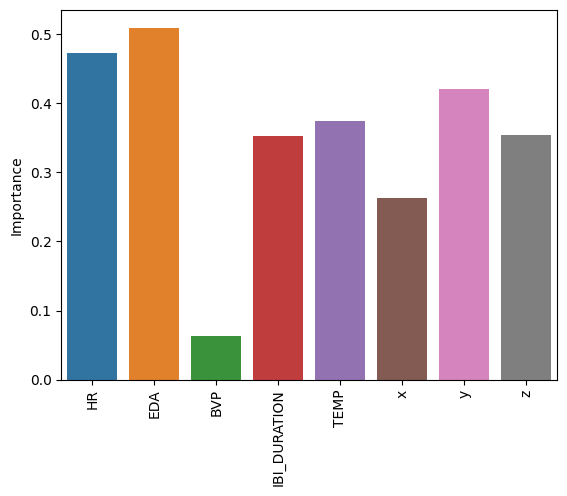

In [522]:
for participant in participants:
    print('='*100)
    print('XGBoost')
    model = run_model(model_dict=classifier_dictionary['XGBoost'], model_data=model_data, participant_id=participant, scale=False)
    print('\n\n')
    get_feature_importance_graph(model.feature_importances_)
    

# Random Forest Classifier

Random Forest Classifier
PARTICIPANT 29
Total number of rows: 3774
Splitting data into train-test slices 100 rows at a time
Train size: 80 
Test size: 20
Leftover rows: 74 
Moving into train set...

Train value counts: 
 0    2039
1     995
Name: label, dtype: int64
Test value counts: 
 0    484
1    256
Name: label, dtype: int64
----------------------------------------------------------------------------------------------------
Running RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Model scorer: make_scorer(accuracy_score)
Best params: {'n_estimators': 100, 'min_samples_leaf': 5, 'max_depth': 5}
RSCV: Mean Train Score: 0.9885685077228231
RSCV: Mean Test Score: 0.6603564356435643
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       484
           1       0.97      0.84      0.90       256

    accuracy                           0.94       740
   macro avg       0.95      0.91      0.93       740
weight

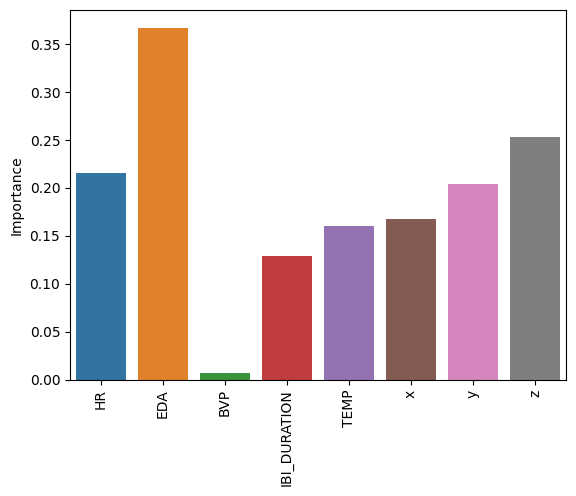

In [525]:
for participant in participants_test:
    print('='*100)
    print('Random Forest Classifier')
    model = run_model(model_dict=classifier_dictionary['Random Forest'], model_data=model_data, participant_id=participant, scale=False)
    print('\n\n')
    get_feature_importance_graph(model.feature_importances_)